<a href="https://colab.research.google.com/github/mazinka/DS_20250308_Electricity/blob/main/electricity_v1_FI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Total electricity demand (tsd) in UK - analysis and prediction**

The project aims to analyze data on total electricity demand in the UK and generate electricity demand forecasts (TSD) using various models. At the end of the analysis, the forecast results from each model will be compared.

# Python libraries

In [ ]:
import numpy as np
import pandas as pd
from pandas import Grouper
from pandas.plotting import autocorrelation_plot

import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.tsa.seasonal import STL

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.impute import SimpleImputer
from sklearn.model_selection import ParameterGrid

import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from matplotlib import cm
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

import xgboost as xgb
from xgboost import XGBRegressor


# Data loading and data validation

In this section, data from a CSV file will be loaded into the notebook. The data will then be checked for:
- data accuracy – data formats, whether the data is in a date format,
- data completeness – whether there are no empty fields, whether columns are filled,
- data uniqueness – whether there are no duplicates.

In [ ]:
electricity = pd.read_csv('historic_demand_2009_2024_noNaN.csv',  parse_dates=["settlement_date"])
electricity.info()
electricity.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278512 entries, 0 to 278511
Data columns (total 19 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   settlement_date            278512 non-null  datetime64[ns]
 1   settlement_period          278512 non-null  int64         
 2   period_hour                278512 non-null  object        
 3   nd                         278512 non-null  int64         
 4   tsd                        278512 non-null  int64         
 5   england_wales_demand       278512 non-null  int64         
 6   embedded_wind_generation   278512 non-null  int64         
 7   embedded_wind_capacity     278512 non-null  int64         
 8   embedded_solar_generation  278512 non-null  int64         
 9   embedded_solar_capacity    278512 non-null  int64         
 10  non_bm_stor                278512 non-null  int64         
 11  pump_storage_pumping       278512 non-null  int64   

,settlement_date,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
0,2009-01-01 00:00:00,1,0:00:00,37910,38704,33939,54,1403,0,0,0,33,2002,0,0,-161,0,0,1
1,2009-01-01 00:30:00,2,0:30:00,38047,38964,34072,53,1403,0,0,0,157,2002,0,0,-160,0,0,1
2,2009-01-01 01:00:00,3,1:00:00,37380,38651,33615,53,1403,0,0,0,511,2002,0,0,-160,0,0,1
3,2009-01-01 01:30:00,4,1:30:00,36426,37775,32526,50,1403,0,0,0,589,1772,0,0,-160,0,0,1
4,2009-01-01 02:00:00,5,2:00:00,35687,37298,31877,50,1403,0,0,0,851,1753,0,0,-160,0,0,1


# Data source and explanation of individual variables

The dataset was downloaded from www.kaggle.com. The data was downloaded in a csv file format, containing various data from 1-1-2009 to 5-12-2024.

Explanation of individual variables

1. settlement_date - A timestamp of a specific half-hour interval.
Units: Date + Time (UTC or local for the UK).
2. settlement_period - the settlement period number (1–48 within a 24-hour period, each = 30 minutes).
Units: Integer (no physical unit).
3. period_hour - the time as an hour:minute of a given interval.
Units: Time (HH:MM).
4. nd - most likely means: Net Demand — the net demand of the system.
Units: MW (megawatts).
This is typically: demand minus embedded generation (PV + distributed wind).
5. tsd - total System Demand — total demand in the system.
Units: MW.
6. england_wales_demand - demand in England and Wales alone.
Units: MW.
7. embedded_wind_generation - energy production from distributed wind connected to the distribution grid (not the national grid).
Units: MW.
8. embedded_wind_capacity - installed distributed wind capacity (potential, not production).
Units: MW.
9. embedded_solar_generation - energy production from distributed solar installations.
Units: MW.
10. embedded_solar_capacity - installed distributed PV capacity.
Units: MW.
11. non_bm_stor - production or consumption of energy storage facilities that do not participate in the balancing market (BM).
Units: MW.
(Usually: positive value = generation, negative = charging.)
12. pump_storage_pumping - energy consumption by pumped-storage plants while pumping water uphill.
Units: MW (positive value = power consumption).
13. ifa_flow - power flow through the IFA interconnector (UK ↔ France).
Units: MW.
Usually:
• MW = import to the UK
– MW = export from the UK
14. ifa2_flow - second interconnector with France (IFA2).
Units: MW.
15. britned_flow - BritNed interconnector (UK ↔ Netherlands).
Units: MW.
16. moyle_flow - Moyle Interconnector (UK ↔ Northern Ireland).
Units: MW.
17. east_west_flow - East–West Interconnector (Wales ↔ Ireland).
Units: MW.
18. nemo_flow - Nemo Link Interconnector (UK ↔ Belgium).
Units: MW.
19. is_holiday - whether the day is a public holiday/day off.
Units:
0 – working day
1 – public holiday

Copies of the source file were made to secure data and ensure work continuity.
These copies allow the original file version to be preserved in the event of editing errors, data corruption, or unwanted changes. These copies allow for reverting to a previous, correct version of the material without having to recreate the file. Furthermore, creating copies of the source file facilitates change control, testing various solutions, and minimizes the risk of losing important information.

The original file contains 278,512 data points. There are 19 columns with different variables. The data format is integer, one column is of type object, and one column is of type datatime.

In [ ]:
elect = electricity.copy()
elect
elect.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278512 entries, 0 to 278511
Data columns (total 19 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   settlement_date            278512 non-null  datetime64[ns]
 1   settlement_period          278512 non-null  int64         
 2   period_hour                278512 non-null  object        
 3   nd                         278512 non-null  int64         
 4   tsd                        278512 non-null  int64         
 5   england_wales_demand       278512 non-null  int64         
 6   embedded_wind_generation   278512 non-null  int64         
 7   embedded_wind_capacity     278512 non-null  int64         
 8   embedded_solar_generation  278512 non-null  int64         
 9   embedded_solar_capacity    278512 non-null  int64         
 10  non_bm_stor                278512 non-null  int64         
 11  pump_storage_pumping       278512 non-null  int64   

In [ ]:
elect.isnull().sum()

,0
settlement_date,0
settlement_period,0
period_hour,0
nd,0
tsd,0
england_wales_demand,0
embedded_wind_generation,0
embedded_wind_capacity,0
embedded_solar_generation,0
embedded_solar_capacity,0



Checking whether there are no duplicates in the data.

In [ ]:
elect[elect.duplicated()]

,settlement_date,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday


# Data analysis, trend and seasonality

In [ ]:
elect = elect.set_index("settlement_date").sort_index()
elect

,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
settlement_date,,,,,,,,,,,,,,,,,,
2009-01-01 00:00:00,1,0:00:00,37910,38704,33939,54,1403,0,0,0,33,2002,0,0,-161,0,0,1
2009-01-01 00:30:00,2,0:30:00,38047,38964,34072,53,1403,0,0,0,157,2002,0,0,-160,0,0,1
2009-01-01 01:00:00,3,1:00:00,37380,38651,33615,53,1403,0,0,0,511,2002,0,0,-160,0,0,1
2009-01-01 01:30:00,4,1:30:00,36426,37775,32526,50,1403,0,0,0,589,1772,0,0,-160,0,0,1
2009-01-01 02:00:00,5,2:00:00,35687,37298,31877,50,1403,0,0,0,851,1753,0,0,-160,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-05 21:30:00,44,21:30:00,29114,31431,27212,5377,6622,0,17194,0,736,558,758,1003,-450,-531,999,0
2024-12-05 22:00:00,45,22:00:00,27204,29846,25477,5486,6622,0,17194,0,868,-193,263,1002,-450,-531,949,0
2024-12-05 22:30:00,46,22:30:00,26006,28805,24428,5594,6622,0,17194,0,944,-274,211,997,-450,-531,943,0


In [ ]:
# tsd time series visualization
fig = px.line(elect, x=elect.index, y="tsd", title="Total System Demand - tsd")
fig.update_layout(width=1200, height=600)
fig.show()

The graph shows total electricity demand from January 1, 2009, to December 5, 2024. A trend can be discerned from the graph above. In this case, the trend is decreasing. The time series graph also shows a clear seasonality, manifested by regular, recurring patterns of value changes at specific intervals. This indicates that the data exhibit cyclical fluctuations, which may be caused by ongoing processes occurring in the system under study. Individual seasonal periods follow a similar pattern, with increases and decreases observed at similar times, indicating a dependence of the variable on the season, month, day of the week, or other regular cycle. This seasonality clearly distinguishes itself from the long-term trend because its nature is cyclical, not continuous. The presence of seasonality suggests the need to consider it in further statistical analysis and modeling, as ignoring it could lead to incorrect forecasts or interpretation of results.

In [ ]:
fig = px.histogram(elect, x="tsd", nbins=50, title="Histogram Total System Demand - tsd")
fig.update_layout(width=1000, height=600)
fig.update_traces(marker_line_width=1, marker_line_color='black')
fig.show()

The histogram is skewed to the right. This means that most observations have relatively low values. The data are clustered towards the left side of the graph. In contrast, a smaller number of observations have high values. On the right side, there are fewer cases, but they have significantly higher tsd values. Therefore, the mean is greater than the median. The tsd data will not meet the assumptions of normality, and this will impact the choice of models for analysis and the tsd predictions.

In [ ]:
elect1 = elect.drop(columns=['settlement_period'])


In [ ]:
# basic variable statistics
elect1.describe().round(1)

,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
count,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0,278512.0
mean,31187.0,32685.8,28389.6,1272.1,4454.0,880.2,8705.1,6.7,304.5,926.2,54.0,504.1,-125.1,-51.1,176.3,0.0
std,7831.3,7598.8,7091.1,966.5,1955.8,1711.0,5869.5,39.2,528.2,1068.8,354.2,541.7,230.4,263.3,422.1,0.1
min,13367.0,16513.0,0.0,0.0,1403.0,0.0,0.0,-24.0,0.0,-2056.0,-1030.0,-1215.0,-505.0,-585.0,-1023.0,0.0
25%,24907.8,26608.0,22676.8,552.0,2109.0,0.0,2046.0,0.0,8.0,271.0,0.0,0.0,-303.0,-209.0,0.0,0.0
50%,30491.0,31800.0,27753.0,1018.0,4831.0,0.0,11503.0,0.0,11.0,1183.0,0.0,726.0,-148.0,0.0,0.0,0.0
75%,36914.0,38112.0,33616.0,1729.0,6527.0,889.0,13080.0,0.0,366.0,1892.0,0.0,994.0,25.0,0.0,338.0,0.0
max,59095.0,60147.0,53325.0,5930.0,6622.0,11224.0,17197.0,893.0,2019.0,2066.0,1016.0,1143.0,499.0,504.0,1033.0,1.0


Basic statistics for the variables are presented above. As can be seen in the tsd time series, the mean is 32685.8 MW, and the median is 31800.0 MW, which is almost 3% lower than the mean. The standard deviation is 7598.8 – this is the amount by which the data are dispersed around the mean.

# TSD Trend and Seasonality Analysis

In [ ]:
# Visualization of the trend and seasonality of total demand electricity
tsd_by_year = elect.groupby([elect.index.year, elect.index.month])['tsd'].mean().round(2)
tsd_by_year.index.set_names(['year', 'month'], inplace=True)
tsd_by_year_df = tsd_by_year.reset_index()

tsd_by_year_df['Year_month'] = tsd_by_year_df['year'].astype(str) + '-' + tsd_by_year_df['month'].astype(str).str.zfill(2)


fig = px.line(
    tsd_by_year_df,
    x='Year_month',
    y='tsd',
    markers=True,
    title='Average value tsd for year and month'
)

fig.update_layout(
    xaxis_title='Year and month',
    yaxis_title='Average value tsd',
    width=1200,
    height=600
)

fig.show()

A downward trend is observed in the time series graph, indicating a systematic decline in the value of the analyzed variable over the long term. This decline is pronounced and occurs despite short-term fluctuations that overlap with the overall trend direction.

At the same time, the data exhibit regular seasonality, manifested by the recurrence of cyclical increases and decreases in subsequent years. Seasonal fluctuations appear at similar periods, indicating that the variable responds to recurring temporal factors characteristic of the process being studied.

However, the analysis indicates that the trend and seasonality are not additive. This means that the amplitude of seasonal fluctuations changes with the trend level – seasonal values ​​are not a constant deviation from the trend line, but rather change their magnitude depending on the current level of the series.

Therefore, further analysis should consider both the decreasing nature of the trend and the variability of the amplitude of seasonality to correctly model the analyzed variable and avoid erroneous forecasts resulting from the assumptions of additivity of time series components.

In [ ]:
# Visualization of the seasonality of the tsd time series by year
tsd_by_year = elect.groupby([elect.index.year, elect.index.month])['tsd'].mean().round(2)

for year in tsd_by_year.index.get_level_values(0).unique():
    tsd_by_month = tsd_by_year.loc[year]
    fig = go.Figure(
        go.Bar(
            x=tsd_by_month.index,
            y=tsd_by_month.values,
            marker_color='lightgreen'
        )
    )
    fig.update_layout(
        title=f'Average value tsd {year} per month',
        xaxis_title='Month',
        yaxis_title='Average value tsd',
        width=1000,
        height=400,
        xaxis=dict(
            tickmode='array',
            tickvals=list(range(1, 13)),
            ticktext=[str(m) for m in range(1, 13)]
        )
    )
    fig.show()

Each year, seasonality in total electricity demand is observed, which is parabolic. Declines begin in March, reaching the lowest levels in June, July, and August. Demand begins to rise in September, reaching its highest levels in November and December. The beginning and end of the year are comparable in terms of total electricity demand.

**TSD Trend and seasonality representation - whisker chart**

/tmp/ipython-input-1776305278.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'Hourly box plot tsd (seasonality)')

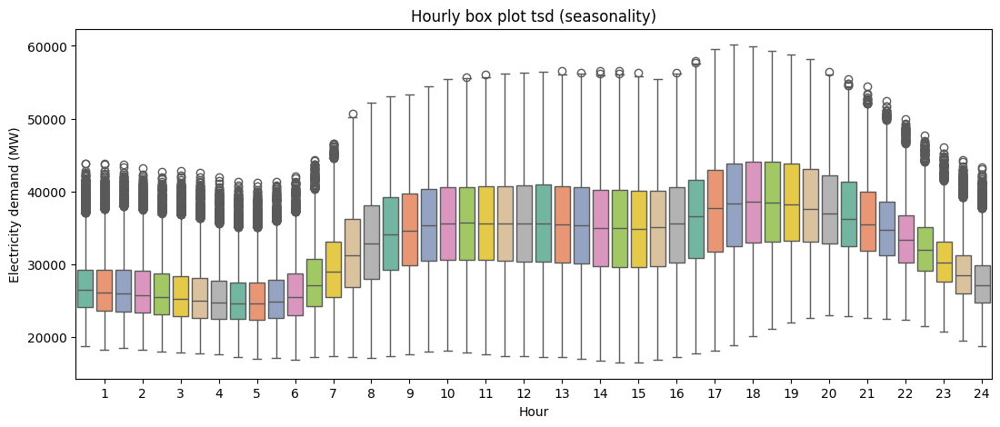

In [ ]:
fig, ax = plt.subplots(figsize=(13, 5))
sns.boxplot(x="settlement_period", y="tsd", data=electricity, palette='Set2')

ax.set_xticks(range(1, 49, 2))
ax.set_xticklabels(range(1, 25))
ax.set_xlabel("Hour")
ax.set_ylabel("Electricity demand (MW)")
ax.set_title("Hourly box plot tsd (seasonality)")

The graph shows electricity demand by hour. As you can see, the lowest demand occurs during the night hours – from midnight to 5:30 a.m. Demand increases until 9:00 a.m. and remains at a similar level until 4:30 p.m. This time frame is when most people work. From 5:00 p.m. to 7:00 p.m., electricity demand increases, then begins to decline until midnight, when demand for electricity is at its lowest.

/tmp/ipython-input-1288347895.py:32: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



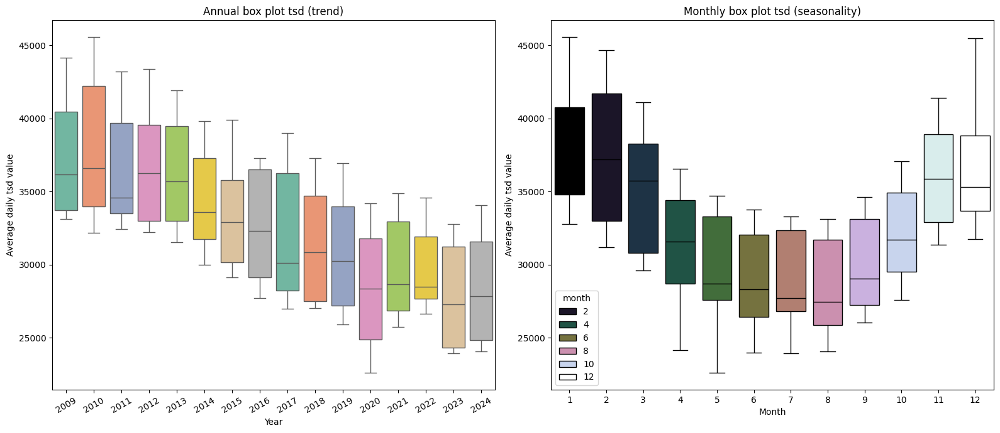

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

tsd_by_year.index.set_names(['year', 'month'], inplace=True)
tsd_by_year_df = tsd_by_year.reset_index()

sns.boxplot(
    x='year',
    y='tsd',
    data=tsd_by_year_df,
    ax=axes[0],
    palette='Set2',
    hue='year',
    legend=False
).set(
    xlabel='Year',
    ylabel='Average daily tsd value'
)

sns.boxplot(
    x='month',
    y='tsd',
    data=tsd_by_year_df,
    ax=axes[1],
    palette='cubehelix',
    hue='month',
).set(
    xlabel='Month',
    ylabel='Average daily tsd value'
)

axes[0].set_title('Annual box plot tsd (trend)')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=30)
axes[1].set_title('Monthly box plot tsd (seasonality)')

plt.tight_layout()
plt.show()

**TSD trend**

In the analyzed time series from 2009 to 2020, a clear downward trend is observed, resulting in lower electricity demand over the long term. This decline is persistent and consistent, despite short-term fluctuations and possible seasonal effects. This means that during this period, a downward trend prevailed, and the variable responded to factors causing a gradual reduction in its value.

After 2020, the dynamics of change weakened significantly. This was the year the COVID pandemic broke out. The trend lost its clearly downward trend and flattened out, as evidenced by stabilization around a similar level. In 2021, demand for electricity demand increased. In the following years, 2022-2024, a systematic decline was no longer observed, but rather fluctuations with a limited amplitude, indicating the achievement of a state of relative equilibrium.

The 2020-2024 period should be analyzed as a separate data set due to other mechanisms that have impacted electricity demand. This will also impact the forecasts, especially since historical data reaches back to 2009.

**TSD seasonality**

Analysis of monthly seasonality indicates a characteristic, non-linear pattern of changes, the shape of which is similar to a parabola. In the first part of the year, a gradual decline in electricity values ​​is observed, beginning in March and deepening until June, indicating a systematic weakening of the studied phenomenon in the spring.

In the summer months, i.e., from June to August, the variable level becomes relatively stable. During this time period, values ​​remain at a similar level, and the amplitude of fluctuations is limited, indicating the lowest demand for electricity in the summer months.

From September on, a change in trend is noticeable – a gradual increase in the tsd value occurs, which persists until November. This increase completes the parabolic seasonal pattern, suggesting that the variable returns to higher levels under the influence of factors characteristic of the autumn and winter periods.

The overall observed pattern confirms the existence of a clear monthly seasonality of a non-linear nature, which should be taken into account in further analysis and modeling, especially when selecting forecasting methods sensitive to variable seasonal effects.

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

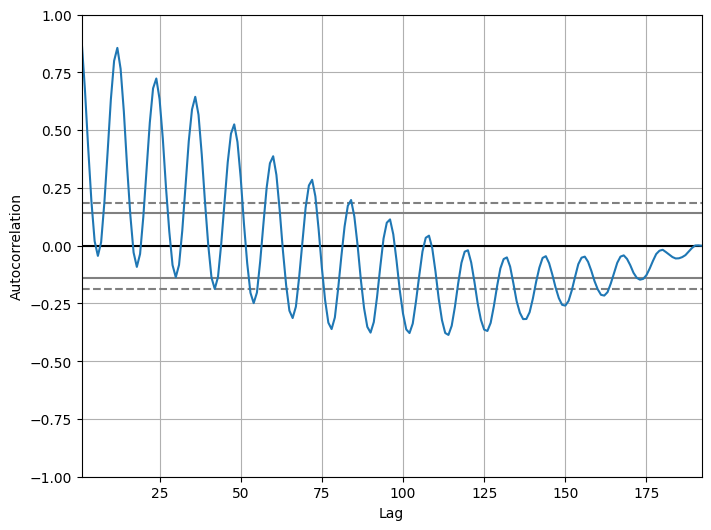

In [ ]:
# TSD autocorrelation plot
plt.figure(figsize=(8, 6))
autocorrelation_plot(tsd_by_year_df['tsd'].tolist())

The above TSD autocorrelation graph indicates that there are strong time dependencies and non-stationarity of the series (trend).

# **Prediction of total electricity demand according to various models - prediction divided into hours**

In [ ]:
elect_H = electricity.copy()
elect_H

,settlement_date,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
0,2009-01-01 00:00:00,1,0:00:00,37910,38704,33939,54,1403,0,0,0,33,2002,0,0,-161,0,0,1
1,2009-01-01 00:30:00,2,0:30:00,38047,38964,34072,53,1403,0,0,0,157,2002,0,0,-160,0,0,1
2,2009-01-01 01:00:00,3,1:00:00,37380,38651,33615,53,1403,0,0,0,511,2002,0,0,-160,0,0,1
3,2009-01-01 01:30:00,4,1:30:00,36426,37775,32526,50,1403,0,0,0,589,1772,0,0,-160,0,0,1
4,2009-01-01 02:00:00,5,2:00:00,35687,37298,31877,50,1403,0,0,0,851,1753,0,0,-160,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
278507,2024-12-05 21:30:00,44,21:30:00,29114,31431,27212,5377,6622,0,17194,0,736,558,758,1003,-450,-531,999,0
278508,2024-12-05 22:00:00,45,22:00:00,27204,29846,25477,5486,6622,0,17194,0,868,-193,263,1002,-450,-531,949,0
278509,2024-12-05 22:30:00,46,22:30:00,26006,28805,24428,5594,6622,0,17194,0,944,-274,211,997,-450,-531,943,0
278510,2024-12-05 23:00:00,47,23:00:00,23908,26825,22590,5575,6622,0,17194,0,864,-404,-77,280,-450,-522,338,0


In [ ]:
# adding variables of days, months, years and lagged variables
elect_H['day'] = elect_H['settlement_date'].dt.day
elect_H['month'] = elect_H['settlement_date'].dt.month
elect_H['year'] = elect_H['settlement_date'].dt.year

for lag in [1, 2, 3, 6, 12, 24]:
    elect_H[f"tsd_lag{lag}"] = elect_H["tsd"].shift(lag)

elect_H

,settlement_date,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,...,is_holiday,day,month,year,tsd_lag1,tsd_lag2,tsd_lag3,tsd_lag6,tsd_lag12,tsd_lag24
0,2009-01-01 00:00:00,1,0:00:00,37910,38704,33939,54,1403,0,0,...,1,1,1,2009,NaN,NaN,NaN,NaN,NaN,NaN
1,2009-01-01 00:30:00,2,0:30:00,38047,38964,34072,53,1403,0,0,...,1,1,1,2009,38704.0,NaN,NaN,NaN,NaN,NaN
2,2009-01-01 01:00:00,3,1:00:00,37380,38651,33615,53,1403,0,0,...,1,1,1,2009,38964.0,38704.0,NaN,NaN,NaN,NaN
3,2009-01-01 01:30:00,4,1:30:00,36426,37775,32526,50,1403,0,0,...,1,1,1,2009,38651.0,38964.0,38704.0,NaN,NaN,NaN
4,2009-01-01 02:00:00,5,2:00:00,35687,37298,31877,50,1403,0,0,...,1,1,1,2009,37775.0,38651.0,38964.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
278507,2024-12-05 21:30:00,44,21:30:00,29114,31431,27212,5377,6622,0,17194,...,0,5,12,2024,32276.0,33433.0,34676.0,37950.0,37309.0,36871.0
278508,2024-12-05 22:00:00,45,22:00:00,27204,29846,25477,5486,6622,0,17194,...,0,5,12,2024,31431.0,32276.0,33433.0,37360.0,38520.0,37198.0
278509,2024-12-05 22:30:00,46,22:30:00,26006,28805,24428,5594,6622,0,17194,...,0,5,12,2024,29846.0,31431.0,32276.0,36009.0,39014.0,37093.0
278510,2024-12-05 23:00:00,47,23:00:00,23908,26825,22590,5575,6622,0,17194,...,0,5,12,2024,28805.0,29846.0,31431.0,34676.0,39483.0,36897.0


In [ ]:
elect_H.isnull().sum()

,0
settlement_date,0
settlement_period,0
period_hour,0
nd,0
tsd,0
england_wales_demand,0
embedded_wind_generation,0
embedded_wind_capacity,0
embedded_solar_generation,0
embedded_solar_capacity,0


In [ ]:
elect_H = elect_H.dropna()
elect_H.info()

<class 'pandas.core.frame.DataFrame'>
Index: 278488 entries, 24 to 278511
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   settlement_date            278488 non-null  datetime64[ns]
 1   settlement_period          278488 non-null  int64         
 2   period_hour                278488 non-null  object        
 3   nd                         278488 non-null  int64         
 4   tsd                        278488 non-null  int64         
 5   england_wales_demand       278488 non-null  int64         
 6   embedded_wind_generation   278488 non-null  int64         
 7   embedded_wind_capacity     278488 non-null  int64         
 8   embedded_solar_generation  278488 non-null  int64         
 9   embedded_solar_capacity    278488 non-null  int64         
 10  non_bm_stor                278488 non-null  int64         
 11  pump_storage_pumping       278488 non-null  int64       

In [ ]:
elect_H.isnull().sum()

,0
settlement_date,0
settlement_period,0
period_hour,0
nd,0
tsd,0
england_wales_demand,0
embedded_wind_generation,0
embedded_wind_capacity,0
embedded_solar_generation,0
embedded_solar_capacity,0


# The correlation coefficients between the tsd variable and the remaining variables.

The correlation coefficient measures the strength and direction of a linear relationship between two variables. It takes values ​​between –1 and 1, where the sign indicates the direction of the relationship, while the absolute value indicates its strength.

A positive value of the correlation coefficient means that as one variable increases, the other also increases.

A negative value indicates that an increase in one variable is associated with a decrease in the other.

A value close to zero suggests no significant linear relationship.

In [ ]:
corr_matrix = elect_H.select_dtypes(include='number').corr()['tsd'].round(2).sort_values(ascending=False)
print(corr_matrix)

tsd                          1.00
nd                           0.99
england_wales_demand         0.99
tsd_lag1                     0.99
tsd_lag2                     0.97
tsd_lag3                     0.93
tsd_lag6                     0.79
tsd_lag12                    0.50
settlement_period            0.39
tsd_lag24                    0.26
non_bm_stor                  0.14
britned_flow                 0.04
day                         -0.03
is_holiday                  -0.07
month                       -0.10
ifa2_flow                   -0.10
ifa_flow                    -0.14
embedded_wind_generation    -0.15
nemo_flow                   -0.15
east_west_flow              -0.17
embedded_solar_generation   -0.17
moyle_flow                  -0.29
pump_storage_pumping        -0.41
embedded_wind_capacity      -0.44
year                        -0.44
embedded_solar_capacity     -0.45
Name: tsd, dtype: float64


In the above example, we can see that the variable nd has a very high correlation with tsd, at -0.99. We will remove this variable in the following sections because it represents electricity demand, but in net terms. The other variables correlated with tsd are lagged variables. The variable embedded_solar_capacity (installed distributed PV capacity) has an inverse correlation with tsd, at -0.45, and this correlation decreases with increasing tsd.

# The correlation coefficients between all variables.

In [ ]:
corr_matrix2 = elect_H.select_dtypes(include='number').corr().round(1)

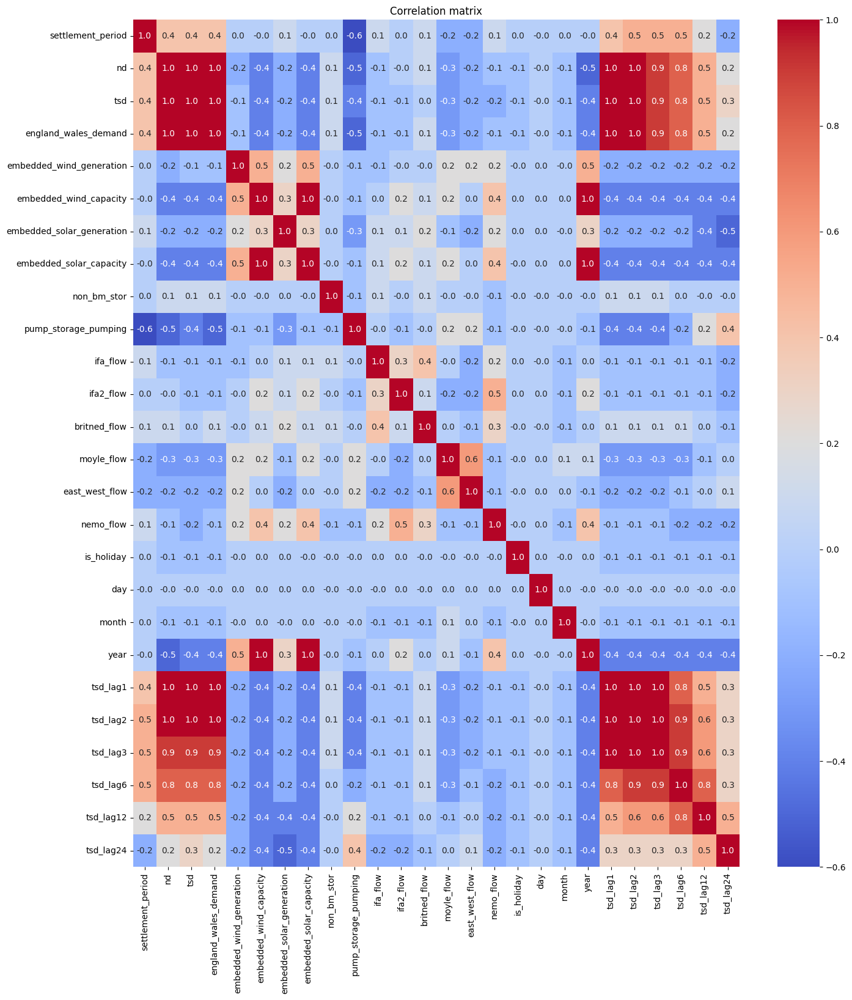

In [ ]:
plt.figure(figsize=(16,18))
sns.heatmap(corr_matrix2, annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Correlation matrix')
plt.show()

In [ ]:
elect_H = elect_H.set_index("settlement_date").sort_index()
elect_H

,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,...,is_holiday,day,month,year,tsd_lag1,tsd_lag2,tsd_lag3,tsd_lag6,tsd_lag12,tsd_lag24
settlement_date,,,,,,,,,,,,,,,,,,,,,
2009-01-01 12:00:00,25,12:00:00,40204,41058,36211,61,1403,0,0,0,...,1,1,1,2009,40013.0,38751.0,37312.0,32079.0,32875.0,38704.0
2009-01-01 12:30:00,26,12:30:00,40672,41457,36617,59,1403,0,0,0,...,1,1,1,2009,41058.0,40013.0,38751.0,33926.0,32720.0,38964.0
2009-01-01 13:00:00,27,13:00:00,40806,41479,36743,59,1403,0,0,0,...,1,1,1,2009,41457.0,41058.0,40013.0,35602.0,31900.0,38651.0
2009-01-01 13:30:00,28,13:30:00,40781,41450,36689,39,1403,0,0,0,...,1,1,1,2009,41479.0,41457.0,41058.0,37312.0,31055.0,37775.0
2009-01-01 14:00:00,29,14:00:00,40758,41427,36823,39,1403,0,0,0,...,1,1,1,2009,41450.0,41479.0,41457.0,38751.0,31094.0,37298.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-05 21:30:00,44,21:30:00,29114,31431,27212,5377,6622,0,17194,0,...,0,5,12,2024,32276.0,33433.0,34676.0,37950.0,37309.0,36871.0
2024-12-05 22:00:00,45,22:00:00,27204,29846,25477,5486,6622,0,17194,0,...,0,5,12,2024,31431.0,32276.0,33433.0,37360.0,38520.0,37198.0
2024-12-05 22:30:00,46,22:30:00,26006,28805,24428,5594,6622,0,17194,0,...,0,5,12,2024,29846.0,31431.0,32276.0,36009.0,39014.0,37093.0


**Division into training and test sets**

In [ ]:
dt_train = elect_H[elect_H.index.year < 2024]
dt_train.tail()

,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,...,is_holiday,day,month,year,tsd_lag1,tsd_lag2,tsd_lag3,tsd_lag6,tsd_lag12,tsd_lag24
settlement_date,,,,,,,,,,,,,,,,,,,,,
2023-12-31 21:30:00,44,21:30:00,25269,25921,22546,2707,6488,0,15905,0,...,0,31,12,2023,26723.0,27980.0,29202.0,32961.0,32458.0,26779.0
2023-12-31 22:00:00,45,22:00:00,24254,24977,21608,2734,6488,0,15905,0,...,0,31,12,2023,25921.0,26723.0,27980.0,31700.0,33170.0,27767.0
2023-12-31 22:30:00,46,22:30:00,23455,24134,20889,2761,6488,0,15905,0,...,0,31,12,2023,24977.0,25921.0,26723.0,30496.0,34000.0,28296.0
2023-12-31 23:00:00,47,23:00:00,22533,23714,20081,2767,6488,0,15905,0,...,0,31,12,2023,24134.0,24977.0,25921.0,29202.0,34494.0,29265.0
2023-12-31 23:30:00,48,23:30:00,22093,23732,19707,2773,6488,0,15905,0,...,0,31,12,2023,23714.0,24134.0,24977.0,27980.0,34360.0,29906.0


In [ ]:
dt_test = elect_H[elect_H.index.year >= 2024]
dt_test.head()

,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,...,is_holiday,day,month,year,tsd_lag1,tsd_lag2,tsd_lag3,tsd_lag6,tsd_lag12,tsd_lag24
settlement_date,,,,,,,,,,,,,,,,,,,,,
2024-01-01 00:00:00,1,0:00:00,21783,23466,19539,2804,6488,0,16726,0,...,1,1,1,2024,23732.0,23714.0,24134.0,26723.0,33935.0,30465.0
2024-01-01 00:30:00,2,0:30:00,22521,24103,20286,2834,6488,0,16726,0,...,1,1,1,2024,23466.0,23732.0,23714.0,25921.0,32961.0,30866.0
2024-01-01 01:00:00,3,1:00:00,22194,24754,20070,2868,6488,0,16726,0,...,1,1,1,2024,24103.0,23466.0,23732.0,24977.0,31700.0,31031.0
2024-01-01 01:30:00,4,1:30:00,21510,24505,19424,2901,6488,0,16726,0,...,1,1,1,2024,24754.0,24103.0,23466.0,24134.0,30496.0,30951.0
2024-01-01 02:00:00,5,2:00:00,20619,23977,18674,2933,6488,0,16726,0,...,1,1,1,2024,24505.0,24754.0,24103.0,23714.0,29202.0,31080.0


In [ ]:
columns_to_drop = ['tsd', 'nd', 'period_hour']

X_train = dt_train.drop(columns=columns_to_drop)
y_train = dt_train['tsd']

X_test = dt_test.drop(columns=columns_to_drop)
y_test = dt_test['tsd']

# **Model Random Forest Regressor**

Random Forest Regressor is an ensemble machine learning model that uses multiple decision trees to forecast a continuous variable. The final prediction is achieved by averaging the results obtained from the individual trees, which increases model stability and reduces the risk of overfitting.

The model is based on random selection of observations and features, effectively representing complex, nonlinear relationships between variables. It does not require the fulfillment of classical parametric model assumptions and can be used for time series forecasting after appropriate preparation of the temporal features.

In [ ]:
model_RFR = RandomForestRegressor(
        random_state=42,
        n_jobs=1
    )

In [ ]:
model_RFR.fit(X_train, y_train)

RandomForestRegressor(n_jobs=1, random_state=42)

In [ ]:
# forecast tsd and errors
y_pred_RFR = model_RFR.predict(X_test)
MAE_H_RFR = mean_absolute_error(y_test, y_pred_RFR)
RMSE_H_RFR = root_mean_squared_error(y_test, y_pred_RFR)
R2_H_RFR = r2_score(y_test, y_pred_RFR)
print(f"MAE: {MAE_H_RFR:.3f}, RMSE: {RMSE_H_RFR:.3f}, R2: {R2_H_RFR: 3f}")

MAE: 263.181, RMSE: 364.394, R2:  0.995864


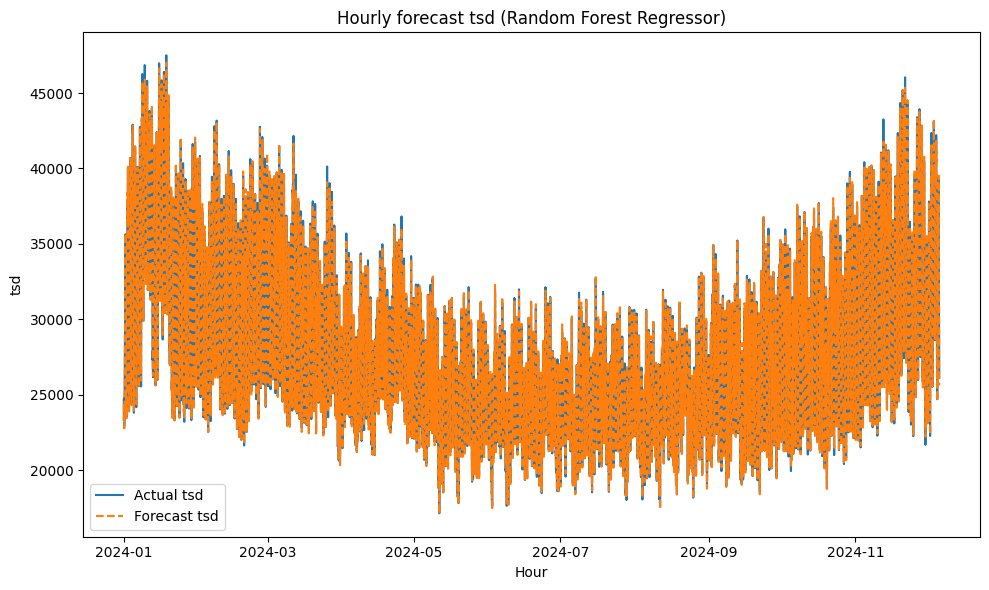

In [ ]:
# TSD chart of actual data and forecast
plt.figure(figsize=(10,6))
plt.plot(y_test.index, y_test.values, label='Actual tsd')
plt.plot(y_test.index, y_pred_RFR, label='Forecast tsd', linestyle='--')
plt.xlabel("Hour")
plt.ylabel("tsd")
plt.title("Hourly forecast tsd (Random Forest Regressor)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# table with tsd data, forecast and losses
tsd_H_RFR = pd.DataFrame({'actual': y_test, 'predicted': y_pred_RFR}, index=y_test.index).round()
tsd_H_RFR['loss_actual_predict'] = tsd_H_RFR['actual'] - tsd_H_RFR['predicted']
tsd_H_RFR.head()

,actual,predicted,loss_actual_predict
settlement_date,,,
2024-01-01 00:00:00,23466,23403.0,63.0
2024-01-01 00:30:00,24103,23265.0,838.0
2024-01-01 01:00:00,24754,23997.0,757.0
2024-01-01 01:30:00,24505,24486.0,19.0
2024-01-01 02:00:00,23977,24115.0,-138.0


In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_H_RFR.describe().round()

,actual,predicted,loss_actual_predict
count,16318.0,16318.0,16318.0
mean,27974.0,27940.0,33.0
std,5666.0,5631.0,363.0
min,17138.0,17108.0,-2399.0
25%,23607.0,23584.0,-182.0
50%,26844.0,26842.0,4.0
75%,31445.0,31418.0,209.0
max,47507.0,47023.0,2964.0


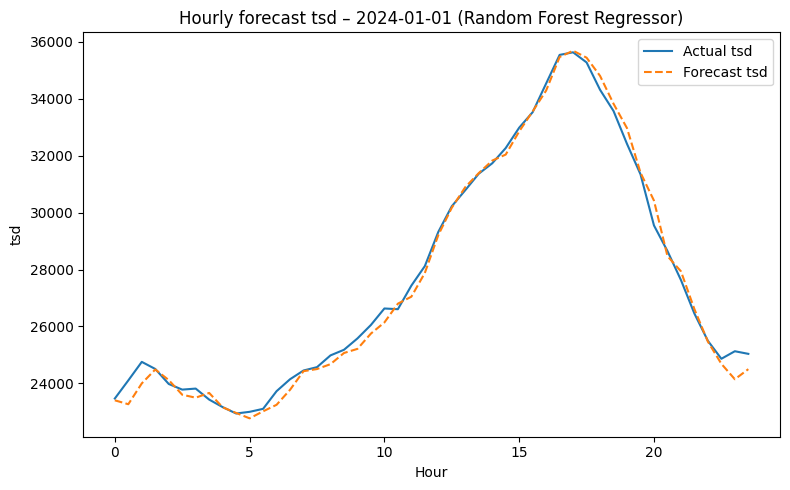

In [ ]:
#example for day

day = '2024-01-01'

# filter data to the selected day
mask = tsd_H_RFR.index.normalize() == pd.to_datetime(day)
xticks = tsd_H_RFR.index[mask].hour + tsd_H_RFR.index[mask].minute / 60

# chart
plt.figure(figsize=(8,5))
plt.plot(xticks, tsd_H_RFR['actual'][mask].values, label='Actual tsd')
plt.plot(xticks, tsd_H_RFR['predicted'][mask].values, label='Forecast tsd', linestyle='--')
plt.xlabel("Hour")
plt.ylabel("tsd")
plt.title(f"Hourly forecast tsd – {day} (Random Forest Regressor)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Losses- the histogram
fig = px.histogram(tsd_H_RFR, x="loss_actual_predict", nbins=40, title="Loss Actual - Predict", width=1000, height=500)
fig.update_traces(marker_line_width=1, marker_line_color='black')
fig.show()

A histogram of residuals with a near-normal distribution indicates that the forecast errors are random and do not contain significant, systematic variations that the model should still explain.

In practice, this means that most residuals are concentrated around zero, with positive and negative errors occurring with similar frequencies. This histogram shape suggests that the model does not exhibit a persistent tendency to overestimate or underestimate the forecasted variable.

In summary, a histogram of residuals with a normal distribution indicates a good fit of the model to the data, correct specification, and an appropriate capture of the dependencies occurring in the time series.

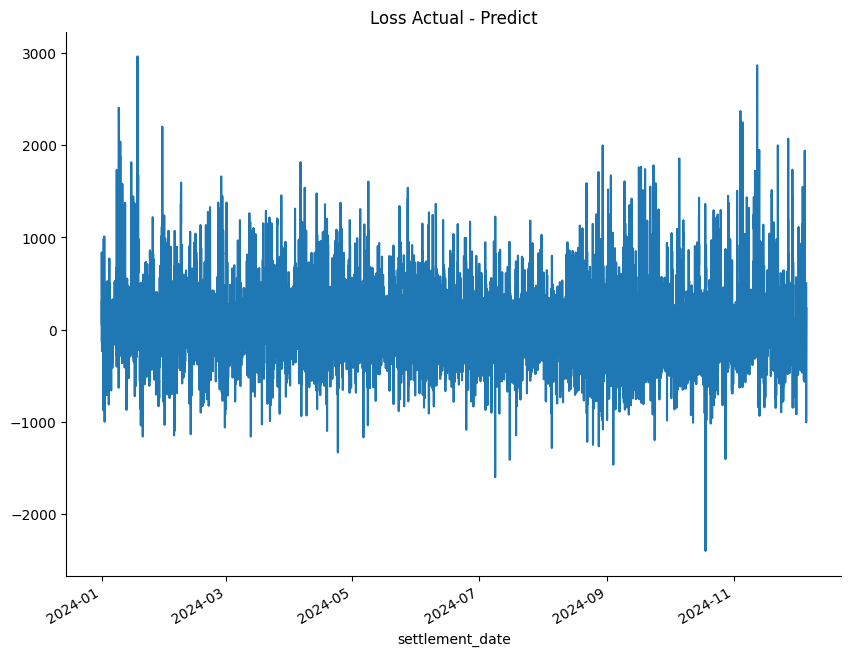

In [ ]:
# Losses plot
tsd_H_RFR['loss_actual_predict'].plot(kind='line', figsize=(10, 8), title='Loss Actual - Predict')
plt.gca().spines[['top', 'right']].set_visible(False)

The Loss values ​​fluctuate around zero, indicating their random nature. No patterns, trends, or cyclical relationships are evident. The small number of outliers indicates good model fit.

# **Model Linear Regression**

A linear regression model is a classic statistical method used to describe and predict the relationship between a dependent variable and one or more explanatory variables. It assumes a linear relationship between the analyzed variables, described by a linear function with constant parameters.

Model parameters are estimated to minimize the sum of squared errors, meaning that the model strives to achieve the best possible fit of a straight line (or hyperplane) to the empirical data. This allows for determining the direction and strength of the influence of individual explanatory variables on the predicted variable.

Linear regression is characterized by simplicity of interpretation, as the model's coefficients indicate the average change in the dependent variable for a single change in a given characteristic, assuming all other variables remain constant. This model is often used as a benchmark in comparative analyses, but its effectiveness depends on meeting certain assumptions, such as linearity of the relationship, independence and randomness of residuals, and constant error variance.

In [ ]:
pipeline_LR = Pipeline([
    ('scaler', StandardScaler()),
    ('est', LinearRegression())
])

param_grid_lr = {
    'est': [LinearRegression()],
    'est__fit_intercept': [True, False],
}

param_grid_lasso = {
    'est': [Lasso(max_iter=10000)],
    'est__alpha': [0.01, 0.1, 1.0, 10.0],
    'est__fit_intercept': [True, False]
}

param_grid = [param_grid_lr, param_grid_lasso]

grid_LR = GridSearchCV(pipeline_LR, param_grid, cv=2, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

In [ ]:
grid_LR.fit(X_train, y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


GridSearchCV(cv=2,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('est', LinearRegression())]),
             n_jobs=-1,
             param_grid=[{'est': [LinearRegression()],
                          'est__fit_intercept': [True, False]},
                         {'est': [Lasso(max_iter=10000)],
                          'est__alpha': [0.01, 0.1, 1.0, 10.0],
                          'est__fit_intercept': [True, False]}],
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
# forecast tsd and errors
y_pred_LR = grid_LR.predict(X_test)
MAE_H_LR = mean_absolute_error(y_test, y_pred_LR)
RMSE_H_LR = root_mean_squared_error(y_test, y_pred_LR)
R2_H_LR = r2_score(y_test, y_pred_LR)
print(f"MAE: {MAE_H_LR:.3f}, RMSE: {RMSE_H_LR:.3f}, R2: {R2_H_LR: 3f}")

MAE: 329.259, RMSE: 425.208, R2:  0.994369


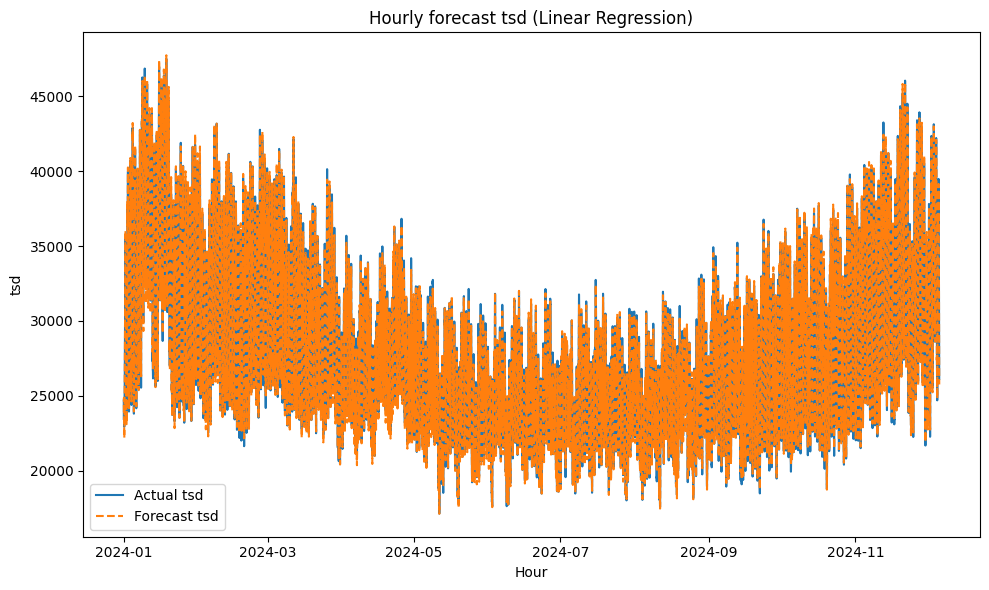

In [ ]:
# TSD chart of actual data and forecast
plt.figure(figsize=(10,6))
plt.plot(y_test.index, y_test.values, label='Actual tsd')
plt.plot(y_test.index, y_pred_LR, label='Forecast tsd', linestyle='--')
plt.xlabel("Hour")
plt.ylabel("tsd")
plt.title("Hourly forecast tsd (Linear Regression)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# table with tsd data, forecast and losses
tsd_H_LR = pd.DataFrame({'actual': y_test, 'predicted': y_pred_LR}, index=y_test.index).round()
tsd_H_LR['loss_actual_predict'] = tsd_H_LR['actual'] - tsd_H_LR['predicted']
tsd_H_LR.head()

,actual,predicted,loss_actual_predict
settlement_date,,,
2024-01-01 00:00:00,23466,23890.0,-424.0
2024-01-01 00:30:00,24103,23892.0,211.0
2024-01-01 01:00:00,24754,24769.0,-15.0
2024-01-01 01:30:00,24505,24871.0,-366.0
2024-01-01 02:00:00,23977,24033.0,-56.0


In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_H_LR.describe().round()

,actual,predicted,loss_actual_predict
count,16318.0,16318.0,16318.0
mean,27974.0,27944.0,30.0
std,5666.0,5670.0,424.0
min,17138.0,17126.0,-2834.0
25%,23607.0,23532.0,-244.0
50%,26844.0,26854.0,18.0
75%,31445.0,31441.0,291.0
max,47507.0,47740.0,2734.0


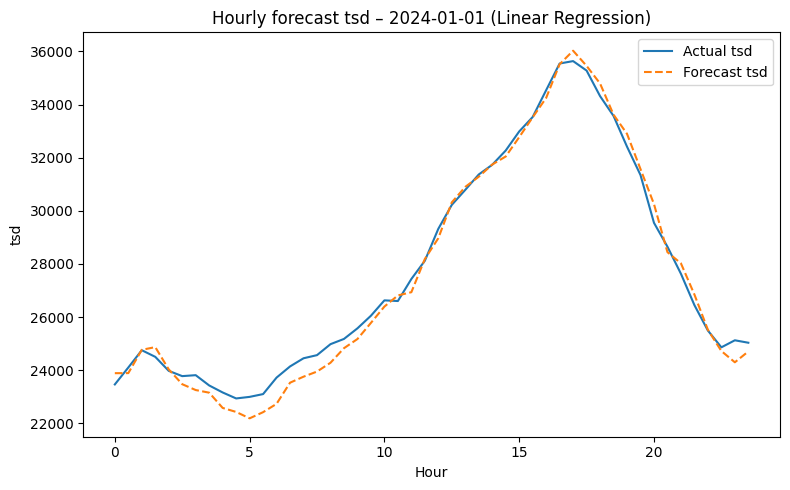

In [ ]:
#example for day

day = '2024-01-01'

# filter data to the selected day
mask = tsd_H_LR.index.normalize() == pd.to_datetime(day)
xticks = tsd_H_LR.index[mask].hour + tsd_H_LR.index[mask].minute / 60

# chart
plt.figure(figsize=(8,5))
plt.plot(xticks, tsd_H_LR['actual'][mask].values, label='Actual tsd')
plt.plot(xticks, tsd_H_LR['predicted'][mask].values, label='Forecast tsd', linestyle='--')
plt.xlabel("Hour")
plt.ylabel("tsd")
plt.title(f"Hourly forecast tsd – {day} (Linear Regression)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Losses- the histogram
fig = px.histogram(tsd_H_LR, x="loss_actual_predict", nbins=40, title="Loss Actual - Predict", width=1000, height=500)
fig.update_traces(marker_line_width=1, marker_line_color='black')
fig.show()

The losses histogram has the shape of a normal distribution

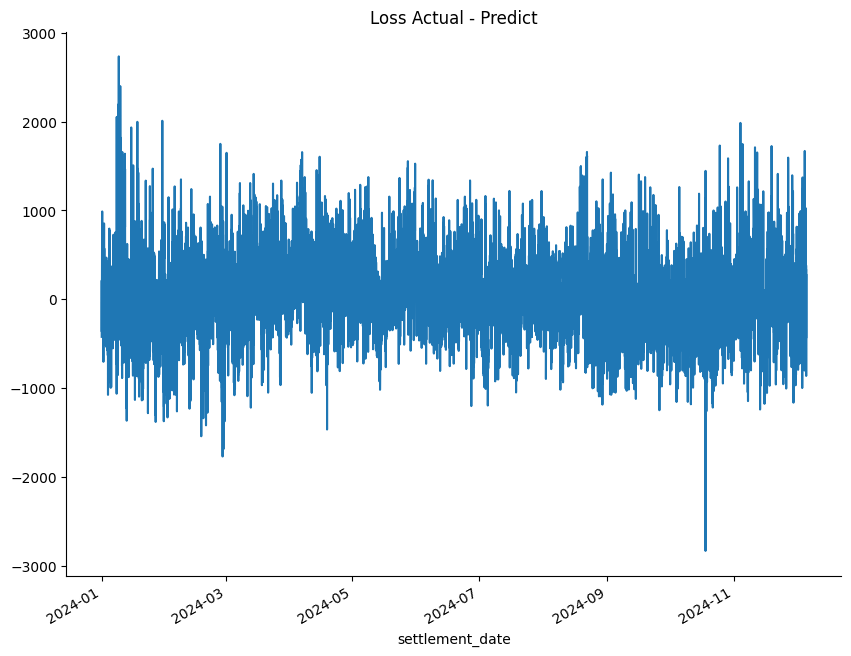

In [ ]:
# Losses plot
tsd_H_LR['loss_actual_predict'].plot(kind='line', figsize=(10, 8), title='Loss Actual - Predict')
plt.gca().spines[['top', 'right']].set_visible(False)

The errors from the tsd forecast are random, showing no patterns or trends. They fluctuate around zero, indicating that the multiple regression model produces good-quality forecasts.

# **Summary of model prediction results - per hours**

Forecasts from the Random Forest Regressor (RFR) and Linear Regressor (LR) models produce very similar results. In the case of the RFR model, the analysis of the forecast against actual data yields MAE (mean absolute error): 263.181, RMSE (root mean squared error): 364.394, R2: 0.995864, while the LR model yields MAE: 329.259, RMSE: 425.208, R2: 0.994369. As you can see, the R2 is very similar. The differences are in the RMSE and MAE errors. The RFR model returns an average tsd of 27940 MW over the forecast period (data from 2024), while the LR model returns 27944 MW. The actual level of total electricity demand during this period was 27974 MW.

# **Prediction of total electricity demand according to various models - prediction divided into days**

In [ ]:
elect_D = elect
elect_D

,settlement_period,period_hour,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
settlement_date,,,,,,,,,,,,,,,,,,
2009-01-01 00:00:00,1,0:00:00,37910,38704,33939,54,1403,0,0,0,33,2002,0,0,-161,0,0,1
2009-01-01 00:30:00,2,0:30:00,38047,38964,34072,53,1403,0,0,0,157,2002,0,0,-160,0,0,1
2009-01-01 01:00:00,3,1:00:00,37380,38651,33615,53,1403,0,0,0,511,2002,0,0,-160,0,0,1
2009-01-01 01:30:00,4,1:30:00,36426,37775,32526,50,1403,0,0,0,589,1772,0,0,-160,0,0,1
2009-01-01 02:00:00,5,2:00:00,35687,37298,31877,50,1403,0,0,0,851,1753,0,0,-160,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-05 21:30:00,44,21:30:00,29114,31431,27212,5377,6622,0,17194,0,736,558,758,1003,-450,-531,999,0
2024-12-05 22:00:00,45,22:00:00,27204,29846,25477,5486,6622,0,17194,0,868,-193,263,1002,-450,-531,949,0
2024-12-05 22:30:00,46,22:30:00,26006,28805,24428,5594,6622,0,17194,0,944,-274,211,997,-450,-531,943,0


In [ ]:
elect_D = elect_D.drop(columns=['period_hour'])
elect_D = elect_D.resample('D').mean().round()
elect_D

,settlement_period,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
settlement_date,,,,,,,,,,,,,,,,,
2009-01-01,24.0,37278.0,38528.0,33528.0,66.0,1403.0,0.0,0.0,0.0,540.0,1702.0,0.0,0.0,-108.0,0.0,0.0,1.0
2009-01-02,24.0,40015.0,41133.0,36087.0,292.0,1403.0,0.0,0.0,5.0,392.0,468.0,0.0,0.0,-78.0,0.0,0.0,0.0
2009-01-03,24.0,39535.0,40668.0,35530.0,185.0,1403.0,0.0,0.0,3.0,442.0,612.0,0.0,0.0,-82.0,0.0,0.0,0.0
2009-01-04,24.0,39821.0,41014.0,35890.0,330.0,1403.0,0.0,0.0,5.0,474.0,378.0,0.0,0.0,-75.0,0.0,0.0,0.0
2009-01-05,24.0,45451.0,47322.0,41007.0,509.0,1403.0,0.0,0.0,10.0,555.0,-506.0,0.0,0.0,-93.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-01,24.0,27127.0,29113.0,25067.0,3054.0,6622.0,306.0,17194.0,0.0,333.0,1073.0,587.0,373.0,-293.0,-109.0,456.0,0.0
2024-12-02,24.0,31288.0,33033.0,28530.0,2453.0,6622.0,466.0,17194.0,0.0,225.0,1205.0,617.0,286.0,-333.0,-339.0,283.0,0.0
2024-12-03,24.0,34014.0,35670.0,30954.0,934.0,6622.0,583.0,17194.0,0.0,177.0,1239.0,576.0,413.0,-385.0,-254.0,373.0,0.0


In [ ]:
# added time variables (trend, month, day of the week, sin/cos)
elect_D['trend'] = np.arange(len(elect_D))
elect_D['month'] = elect_D.index.month
elect_D['dayofweek'] = elect_D.index.dayofweek
elect_D['year'] = elect_D.index.year
elect_D['sin_month'] = np.sin(2 * np.pi * elect_D['month'] / 12)
elect_D['cos_month'] = np.cos(2 * np.pi * elect_D['month'] / 12)
elect_D['sin_dow'] = np.sin(2 * np.pi * elect_D['dayofweek'] / 7)
elect_D['cos_dow'] = np.cos(2 * np.pi * elect_D['dayofweek'] / 7)

In [ ]:
#tsd lagged variable
lag_features = ['tsd']
for col in lag_features:
    for lag in [1,2,3, 6, 12, 24]:
        elect_D[f'{col}_lag{lag}'] = elect_D[col].shift(lag)

In [ ]:
elect_D = elect_D.dropna()
elect_D.info()
elect_D.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5729 entries, 2009-01-25 to 2024-12-05
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   settlement_period          5729 non-null   float64
 1   nd                         5729 non-null   float64
 2   tsd                        5729 non-null   float64
 3   england_wales_demand       5729 non-null   float64
 4   embedded_wind_generation   5729 non-null   float64
 5   embedded_wind_capacity     5729 non-null   float64
 6   embedded_solar_generation  5729 non-null   float64
 7   embedded_solar_capacity    5729 non-null   float64
 8   non_bm_stor                5729 non-null   float64
 9   pump_storage_pumping       5729 non-null   float64
 10  ifa_flow                   5729 non-null   float64
 11  ifa2_flow                  5729 non-null   float64
 12  britned_flow               5729 non-null   float64
 13  moyle_flow                 572

,settlement_period,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,...,sin_month,cos_month,sin_dow,cos_dow,tsd_lag1,tsd_lag2,tsd_lag3,tsd_lag6,tsd_lag12,tsd_lag24
settlement_date,,,,,,,,,,,,,,,,,,,,,
2009-01-25,24.0,37832.0,39081.0,34080.0,881.0,1403.0,0.0,0.0,1.0,420.0,...,0.5,0.866025,-0.781831,0.623490,40620.0,44568.0,45201.0,44842.0,46066.0,38528.0
2009-01-26,24.0,43440.0,45018.0,39141.0,174.0,1403.0,0.0,0.0,0.0,366.0,...,0.5,0.866025,0.000000,1.000000,39081.0,40620.0,44568.0,45894.0,47132.0,41133.0
2009-01-27,24.0,44111.0,46242.0,39869.0,412.0,1403.0,0.0,0.0,0.0,405.0,...,0.5,0.866025,0.781831,0.623490,45018.0,39081.0,40620.0,46453.0,46286.0,40668.0
2009-01-28,24.0,44131.0,45980.0,39849.0,197.0,1403.0,0.0,0.0,4.0,398.0,...,0.5,0.866025,0.974928,-0.222521,46242.0,45018.0,39081.0,45201.0,44067.0,41014.0
2009-01-29,24.0,43696.0,46012.0,39427.0,776.0,1403.0,0.0,0.0,1.0,422.0,...,0.5,0.866025,0.433884,-0.900969,45980.0,46242.0,45018.0,44568.0,38666.0,47322.0


**Division into training and test sets**

In [ ]:
split = int(len(elect_D) * 0.8)

X = elect_D.drop(columns=['tsd', 'nd', 'settlement_period'])
y = elect_D['tsd']

X_D_train, X_D_test = X.iloc[:split], X.iloc[split:]
y_D_train, y_D_test = y.iloc[:split], y.iloc[split:]

In [ ]:
print(X_D_train.shape, y_D_train.shape)
print(X_D_test.shape, y_D_test.shape)

(4583, 28) (4583,)
(1146, 28) (1146,)


In [ ]:
y_D_test.head()

,tsd
settlement_date,
2021-10-17,26900.0
2021-10-18,30333.0
2021-10-19,29146.0
2021-10-20,29233.0
2021-10-21,29107.0


# **Model Linear Regression**

In [ ]:
pipeline_D_LR = Pipeline([
    ('scaler', StandardScaler()),
    ('reg', LinearRegression())
])

param_grid_lr = {
    'reg': [LinearRegression()],
    'reg__fit_intercept': [True, False]
}
param_grid_ridge = {
    'reg': [Ridge()],
    'reg__alpha': [0.1, 1.0, 10.0],
    'reg__fit_intercept': [True, False]
}
param_grid = [param_grid_lr, param_grid_ridge]

grid_LR = GridSearchCV(pipeline_D_LR, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)


In [ ]:
grid_LR.fit(X_D_train, y_D_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('reg', LinearRegression())]),
             n_jobs=-1,
             param_grid=[{'reg': [LinearRegression()],
                          'reg__fit_intercept': [True, False]},
                         {'reg': [Ridge()], 'reg__alpha': [0.1, 1.0, 10.0],
                          'reg__fit_intercept': [True, False]}],
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
# forecast tsd and errors
y_pred_D_LG = grid_LR.predict(X_D_test)
MAE_LG = mean_absolute_error(y_D_test, y_pred_D_LG)
RMSE_LG = root_mean_squared_error(y_D_test, y_pred_D_LG)
R2_LG = r2_score(y_D_test, y_pred_D_LG)
print(f"MAE: {MAE_LG:.3f}, RMSE: {RMSE_LG:.3f}, R2: {R2_LG: 3f}")

MAE: 708.913, RMSE: 1083.370, R2:  0.930531


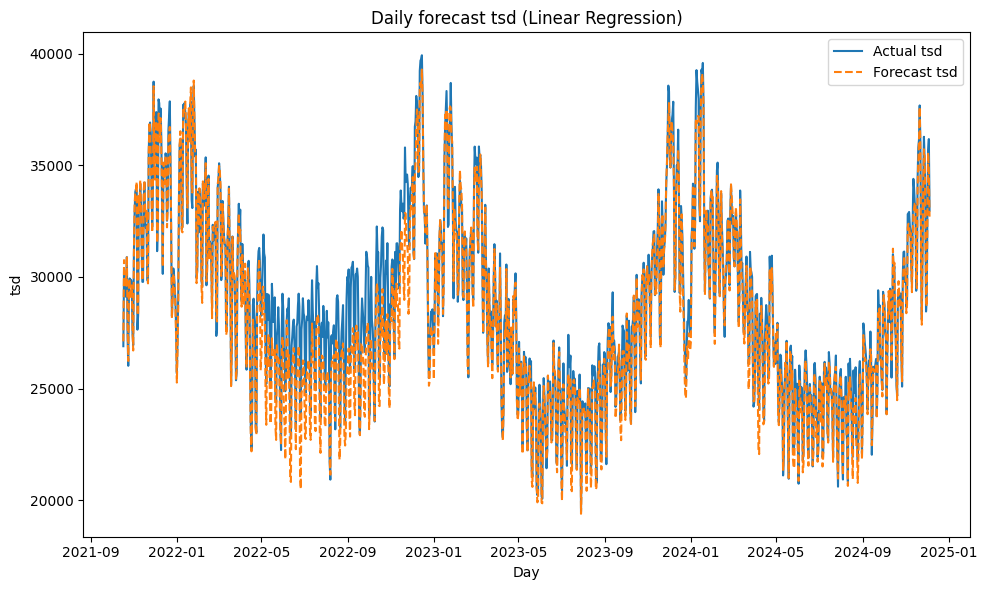

In [ ]:
# TSD chart of actual data and forecast
plt.figure(figsize=(10,6))
plt.plot(y_D_test.index, y_D_test.values, label='Actual tsd')
plt.plot(y_D_test.index, y_pred_D_LG, label='Forecast tsd', linestyle='--')
plt.xlabel("Day")
plt.ylabel("tsd")
plt.title("Daily forecast tsd (Linear Regression)")
plt.legend()
plt.tight_layout()
plt.show()

The chart shows that 2022 is underestimated and has significant forecast errors. However, the model already returns good-quality data for 2023 and 2024. This may be due to the split of the time series, where the forecast begins on October 17, 2021, and 2021 was an exceptional year in terms of actual data. Then, electricity demand increased compared to 2020 (Covid), when the decreasing trend stabilized at a similar level.

In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_D_LG = pd.DataFrame({'actual': y_D_test, 'predicted': y_pred_D_LG}, index=y_D_test.index).round()
tsd_D_LG['loss_actual_predict'] = tsd_D_LG['actual'] - tsd_D_LG['predicted']
tsd_D_LG.head()

,actual,predicted,loss_actual_predict
settlement_date,,,
2021-10-17,26900.0,27117.0,-217.0
2021-10-18,30333.0,30757.0,-424.0
2021-10-19,29146.0,29530.0,-384.0
2021-10-20,29233.0,29937.0,-704.0
2021-10-21,29107.0,29615.0,-508.0


In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_D_LG.describe().round()

,actual,predicted,loss_actual_predict
count,1146.0,1146.0,1146.0
mean,28810.0,28222.0,588.0
std,4112.0,4216.0,910.0
min,19492.0,19395.0,-928.0
25%,25743.0,25125.0,1.0
50%,28452.0,27472.0,306.0
75%,31502.0,31129.0,870.0
max,39930.0,39288.0,4873.0


In [ ]:
# Losses- the histogram
fig = px.histogram(tsd_D_LG, x="loss_actual_predict", nbins=40, title="Loss Actual - Predict", width=1000, height=500)
fig.update_traces(marker_line_width=1, marker_line_color='black')
fig.show()

The histogram is not normally distributed. It is right-skewed, meaning that losses are positive (actual data are higher than predicted). Therefore, the model underestimates the value of the tsd variable. This right-skewness may cause the year 2022 to follow the unnatural year 2021. Data for training were taken from 2009 to October 16, 2021, where the trend was downward for most of the time, whereas from 2020 (Covid) onward, there was no trend.

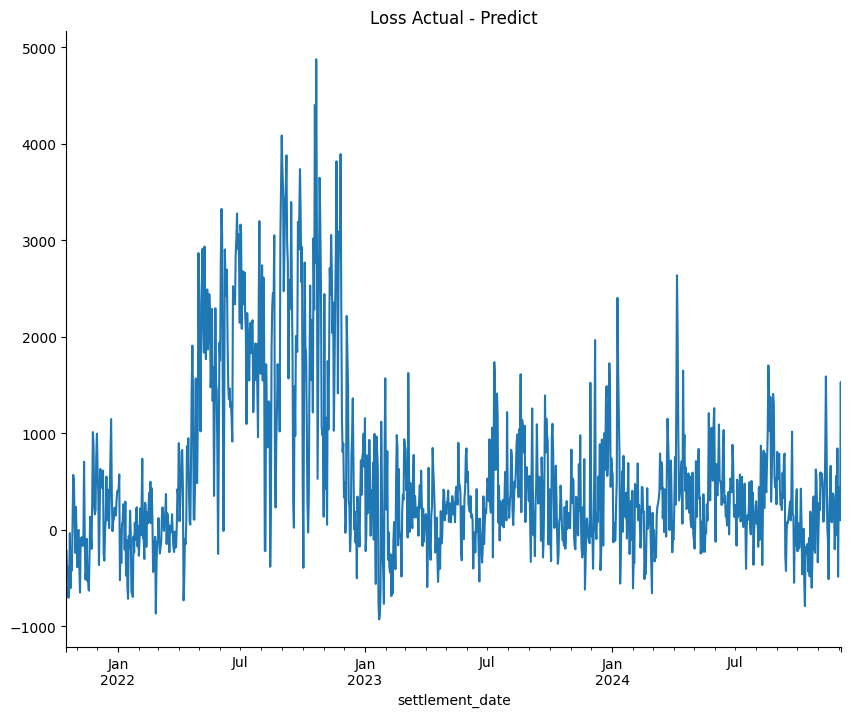

In [ ]:
# losses plot
tsd_D_LG['loss_actual_predict'].plot(kind='line', figsize=(10, 8), title='Loss Actual - Predict')
plt.gca().spines[['top', 'right']].set_visible(False)

The residuals plot shows a pattern, suggesting that seasonality was not properly accounted for by the model. The residual autocorrelation indicates that the model is not learning properly from the training data. It is recommended to change the range of training and test data. Limit the data sample from 2020, when the trend changed from decreasing to flattening at a similar level to 2020.

# **Model XGBoost (Extreme Gradient Boosting)**

XGBoost (Extreme Gradient Boosting) is an advanced machine learning model based on gradient boosting, which builds predictions as the sum of multiple weak models, most often decision trees. These models are trained sequentially, with each successive model focusing on improving the errors made by the previous ones.

The essence of XGBoost is to minimize the loss function using the gradient, while simultaneously applying regularization, which limits model complexity and reduces the risk of overfitting. This allows the model to effectively represent complex, nonlinear relationships between variables.

XGBoost is characterized by high computational efficiency and resistance to multicollinearity and non-normality. In the context of time series forecasting, it can be used after appropriate feature preparation (e.g., time lags, seasonal variables). However, like other tree models, it does not explicitly model the temporal structure.

In [ ]:
pipeline_D_XGB = Pipeline([
    ('scaler', StandardScaler()),
    ('xgb', XGBRegressor(objective='reg:squarederror', random_state=42))
])


param_grid = {
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 5, 7],
    'xgb__learning_rate': [0.03, 0.1, 0.3]
}

grid_D_XGB = GridSearchCV(pipeline_D_XGB, param_grid, cv=3,
                    scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

In [ ]:
grid_D_XGB.fit(X_D_train, y_D_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     device=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     feature_weights=None,
                                                     gamma=None,
                                                     grow_policy=Non...
                                                     max_cat_to_onehot=None,
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None, ...))]),
             n_jobs=-1,
             param_grid={'xgb__learning_rate': [0.03, 0.1, 0.3],
                         'xgb__max_depth': [3, 5, 7],
                         'xgb__n_estimators': [100, 200]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
# forecast tsd and errors
y_pred_XGB = grid_D_XGB.predict(X_D_test)
MAE_XGB = mean_absolute_error(y_D_test, y_pred_XGB)
RMSE_XGB = root_mean_squared_error(y_D_test, y_pred_XGB)
R2_XGB = r2_score(y_D_test, y_pred_XGB)
print(f"MAE: {MAE_XGB:.3f}, RMSE: {RMSE_XGB:.3f}, R2: {R2_XGB: 3f}")

MAE: 693.745, RMSE: 1020.418, R2:  0.938370


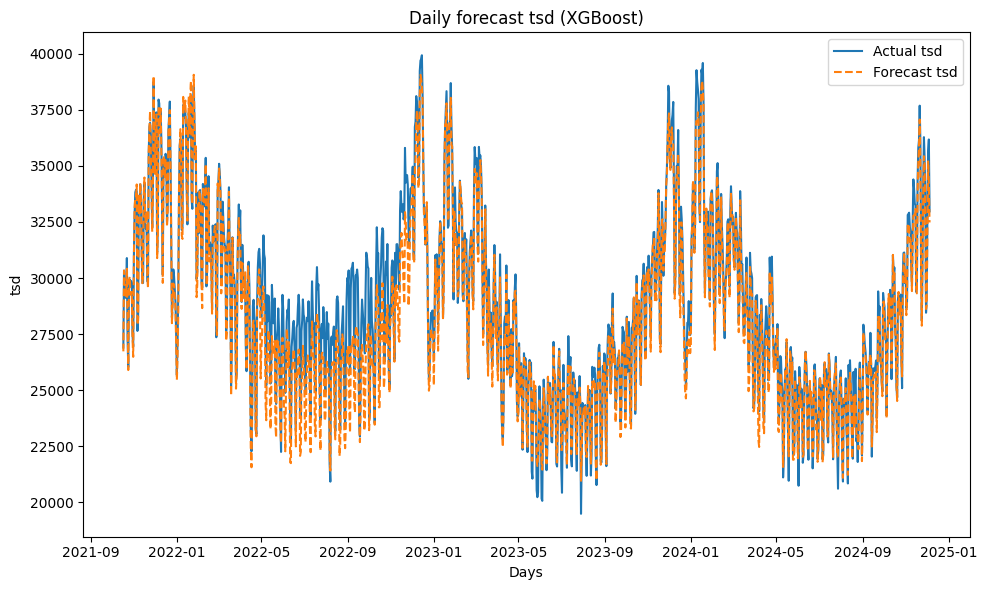

In [ ]:
# TSD chart of actual data and forecast
plt.figure(figsize=(10,6))
plt.plot(y_D_test.index, y_D_test.values, label='Actual tsd')
plt.plot(y_D_test.index, y_pred_XGB, label='Forecast tsd', linestyle='--')
plt.xlabel("Days")
plt.ylabel("tsd")
plt.title("Daily forecast tsd (XGBoost)")
plt.legend()
plt.tight_layout()
plt.show()

As with the Linear Regression model, the XGBoost model's forecast for 2022 is lower than the real electricity data. This indicates that the model was trained on data when the trend was decreasing, and it has flattened since 2020. The test data shows no trend. However, we retain the electricity forecast because it fits 2023 and 2024 well with the real tsd data.

In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_D_XGB = pd.DataFrame({'actual': y_D_test, 'predicted': y_pred_XGB}, index=y_D_test.index).round()
tsd_D_XGB['loss_actual_predict'] = tsd_D_XGB['actual'] - tsd_D_XGB['predicted']
tsd_D_XGB.head()

,actual,predicted,loss_actual_predict
settlement_date,,,
2021-10-17,26900.0,26733.0,167.0
2021-10-18,30333.0,30334.0,-1.0
2021-10-19,29146.0,29250.0,-104.0
2021-10-20,29233.0,29485.0,-252.0
2021-10-21,29107.0,29193.0,-86.0


In [ ]:
# basic statistics for actual data, forecasts, losses
tsd_D_XGB.describe().round()

,actual,predicted,loss_actual_predict
count,1146.0,1146.0,1146.0
mean,28810.0,28228.0,582.0
std,4112.0,4078.0,839.0
min,19492.0,20962.0,-1907.0
25%,25743.0,25204.0,95.0
50%,28452.0,27426.0,370.0
75%,31502.0,30947.0,811.0
max,39930.0,39060.0,4513.0


In [ ]:
# Losses- the histogram
fig = px.histogram(tsd_D_XGB, x="loss_actual_predict", nbins=40, title="Loss Actual - Predict", width=1000, height=500)
fig.update_traces(marker_line_width=1, marker_line_color='black')
fig.show()

The histogram is not normally distributed. It is right-skewed, similar to the Linear Regression model.

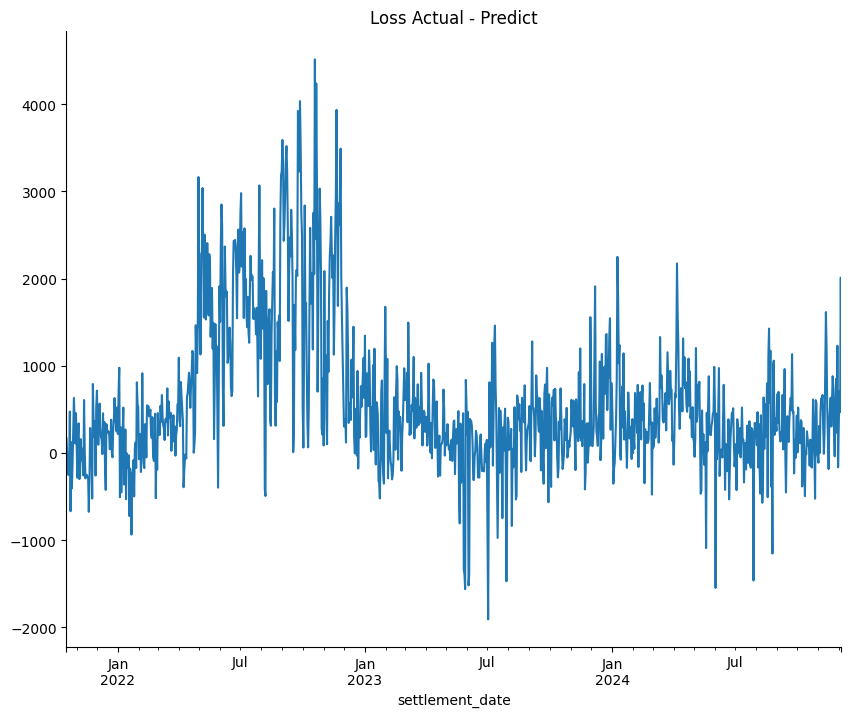

In [ ]:
# losses plot
tsd_D_XGB['loss_actual_predict'].plot(kind='line', figsize=(10, 8), title='Loss Actual - Predict')
plt.gca().spines[['top', 'right']].set_visible(False)

The losses chart shows cyclicality, especially in 2022. This suggests that seasonality may not have been properly accounted for. For further analysis and electricity forecasts, it is recommended to run the model on training data from 2020.

**Annual time series statistics tsd**

In [ ]:
# tsd basic statistic per year
tsd_D_by_year = elect_D.groupby([elect_D.index.year, elect_D.index.month])['tsd'].mean().round(2)
tsd_D_by_year = tsd_D_by_year.unstack(level=0)
tsd_D_by_year.index.name = 'month'

tsd_D_by_year.describe().round(2)

settlement_date,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
count,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00
mean,37497.98,38177.41,36514.65,36592.36,36321.46,34530.76,33419.36,32593.59,31716.44,31431.84,30558.38,28393.67,29630.93,29728.79,27926.74,28365.45
std,4163.03,5184.66,3867.72,3655.47,3985.43,3403.49,3770.03,3896.82,4340.02,4019.23,3789.02,4160.31,3306.82,2662.72,3446.89,3737.74
min,33190.43,32162.00,32429.29,32235.39,31526.94,29988.03,29141.77,27720.52,27005.58,27045.80,25916.84,22610.61,25734.10,26643.74,23961.13,24083.13
25%,33723.04,33997.37,33494.54,33206.63,32979.82,31748.25,30149.35,29150.32,28224.82,27519.45,27227.56,24872.00,26876.65,27687.38,24351.97,24857.83
50%,36179.27,36606.84,34585.10,36252.07,35710.10,33588.94,32912.36,32329.71,30142.04,30868.89,30266.18,28360.44,28654.62,28511.44,27281.84,27836.88
75%,40466.38,42234.74,39666.28,39529.94,39481.74,37294.38,35789.77,36526.86,36235.46,34690.11,33988.66,31775.85,32958.30,31914.66,31233.00,31600.88
max,43868.29,45555.65,43208.10,43368.79,41902.14,39829.48,39886.71,37269.87,39018.13,37272.21,36946.68,34202.87,34877.00,34562.61,32795.65,34083.77


The average total demand tsd decreased each year from the beginning of 2009 to 2020. In 2020, the pandemic changed electricity demand. However, the data has been distorted since 2020, as the tsd demand in 2021 was higher than in the previous year. In 2022 the average tsd remained at the 2021 level, reaching 29728.79 MW. In 2023, the average tsd decreased to 27926.74 MW, and in 2024, it increased again to 28365.45 MW. Since Covid time the demand for electricity has changed.

# **Analysis summary**

In [ ]:
statistics_H = pd.DataFrame([
    {
        'Model': 'Liner_Regression',
        'MAE': MAE_H_LR,
        'RMSE': RMSE_H_LR,
        'R2': R2_H_LR
    },
    {
        'Model': 'XGBRegressor',
        'MAE': MAE_H_RFR,
        'RMSE': RMSE_H_RFR,
        'R2': R2_H_RFR
    }
]).round(3)

statistics_H

,Model,MAE,RMSE,R2
0,Liner_Regression,329.259,425.208,0.994
1,XGBRegressor,263.181,364.394,0.996


A time series forecast of total demand (tsd) for 2024 (by hour), using the Linear Regression (LR) and XGBRegressor (XGBR) models yielded very similar R2 results and forecasts. The R2 for LR was 99.4%, while the XGBR was 99.6%. The models explain data variability very well and return a forecast similar to the tsd (real data) series. The explanatory variables included in the models describe the explained variable very well.
The MAE and RMSE errors for LR are larger than for the XGBR model, which causes the XGBR model to return better results at a comparable R2 level.

In [ ]:
statistics_D = pd.DataFrame([
    {
        'Model': 'Liner_Regres',
        'MAE': MAE_LG,
        'RMSE': RMSE_LG,
        'R2': R2_LG
    },
    {
        'Model': 'XGBRegressor',
        'MAE': MAE_XGB,
        'RMSE': RMSE_XGB,
        'R2': R2_XGB
    }
]).round(3)

statistics_D

,Model,MAE,RMSE,R2
0,Liner_Regres,708.913,1083.370,0.931
1,XGBRegressor,693.745,1020.418,0.938


For comparison purposes, the daily TSD forecast was performed on the same time series as the hourly forecast. The R2 for the Linear Regression and XGBRegressor models is also comparable, but at LR - 93.1% and XGBR - 93.8%, although lower than the forecasts above. At the same time, the models return very good quality forecasts of the daily TSD series. The MAE and RMSE errors are no different than those for the hourly forecast.

When performing a daily TSD forecast, it is recommended to shorten the time series and perform the analysis on training data from 2020 (Covid). The TSD forecast should be performed for 2024, as in the case of the hourly forecast. With the tsd daily forecast, you can make forecasts using both the Linear Regression and XGBRegression models - both are very good and return comparable results.